In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

## Load file : TOL20p-001

In [2]:
data_folder = 'TOL20p-001'
# Gray
Gray_file = f'{data_folder}/ResultGrayMi.csv'
df_gray = pd.read_csv(Gray_file)

#Red
Red_file = f'{data_folder}/ResultRedMi.csv'
df_red = pd.read_csv(Red_file)

#Green
Green_file = f'{data_folder}/ResultGreenMi.csv'
df_green = pd.read_csv(Green_file)

#Blue
Blue_file = f'{data_folder}/ResultBlueMi.csv'
df_blue = pd.read_csv(Blue_file)

### Create a new row with column names

In [3]:
def create_columns_name(df):
    # Create a new row with numerical column names
    column_names = ['time'] + [f'sensor_{i}' for i in range(1, len(df.columns))]
    df_processed = pd.DataFrame([column_names] + df.values.tolist())

    # Update the column names of the DataFrame
    df_processed.columns = df_processed.iloc[0]

    # Remove the first row (numerical column names)
    df_processed = df_processed.iloc[1:]

    return df_processed


# Process each DataFrame individually
df_gray = create_columns_name(df_gray)
df_red = create_columns_name(df_red)
df_green = create_columns_name(df_green)
df_blue = create_columns_name(df_blue)

In [5]:
df_blue

,time,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,...,sensor_54,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_60,sensor_61,sensor_62,sensor_63
1,1.481873,0.160442,-0.231635,-0.284299,-0.040644,0.092016,-0.084909,0.023457,-0.023174,0.213723,...,-0.204324,-0.016857,0.224628,-0.267406,0.187587,-0.017369,0.159282,-0.062991,0.227229,-0.257603
2,2.47436,0.256261,-0.294352,-0.066529,0.253404,-0.01774,0.29253,0.003335,-0.278691,-0.107415,...,0.24742,0.137426,-0.065848,0.019604,0.289028,-0.17609,0.203925,-0.357758,0.211725,-0.035182
3,3.477334,0.466482,-0.348359,-0.124601,-0.299572,0.094455,0.445579,0.123457,-0.336182,-0.126579,...,0.267187,-0.023096,-0.087872,-0.208983,0.238584,-0.108067,-0.014528,-0.354851,0.239155,-0.020871
4,4.469748,-0.181602,-0.315839,0.164017,-0.20612,-0.455545,0.028506,-0.114958,0.172528,-0.035406,...,-0.113626,-0.031605,0.092485,-0.075121,0.032376,-0.154578,0.287853,-0.124618,0.364975,-0.11449
5,4.975978,-0.035261,-0.196792,0.164598,-0.108501,-0.022008,0.401067,-0.128982,0.070322,-0.126579,...,0.063699,0.143665,0.181176,-0.045058,0.068407,-0.270858,0.159877,0.110847,0.398964,-0.087657
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7296,6611.388018,-0.108431,-0.002831,-0.096726,-0.030525,-0.021399,-0.172713,-0.038739,-0.319342,-0.283954,...,-0.240952,-0.412773,-0.455729,-0.403538,-0.3684,-0.528997,-0.399647,-0.694386,-0.164542,-0.642815
7297,6611.388018,-0.108431,-0.002831,-0.096726,-0.030525,-0.021399,-0.172713,-0.038739,-0.319342,-0.283954,...,-0.240952,-0.412773,-0.455729,-0.403538,-0.3684,-0.528997,-0.399647,-0.694386,-0.164542,-0.642815
7298,6611.388018,-0.108431,-0.002831,-0.096726,-0.030525,-0.021399,-0.172713,-0.038739,-0.319342,-0.283954,...,-0.240952,-0.412773,-0.455729,-0.403538,-0.3684,-0.528997,-0.399647,-0.694386,-0.164542,-0.642815
7299,6611.388018,-0.108431,-0.002831,-0.096726,-0.030525,-0.021399,-0.172713,-0.038739,-0.319342,-0.283954,...,-0.240952,-0.412773,-0.455729,-0.403538,-0.3684,-0.528997,-0.399647,-0.694386,-0.164542,-0.642815


#

# Compare Bands

### STD comparison 

In [6]:
# Compute standard deviation by columns (sensors) for each band
std_gray = np.std(df_gray.iloc[:, 1:], axis=0)
std_red = np.std(df_red.iloc[:, 1:], axis=0)
std_green = np.std(df_green.iloc[:, 1:], axis=0)
std_blue = np.std(df_blue.iloc[:, 1:], axis=0)

# Create a table of standard deviation values
sensors = df_gray.columns[1:]  # Exclude the first column (assuming it contains frame data)
result_table_STD = pd.DataFrame({'Sensor': sensors, 'Gray': std_gray, 'Red': std_red, 'Green': std_green,
                             'Blue': std_blue})


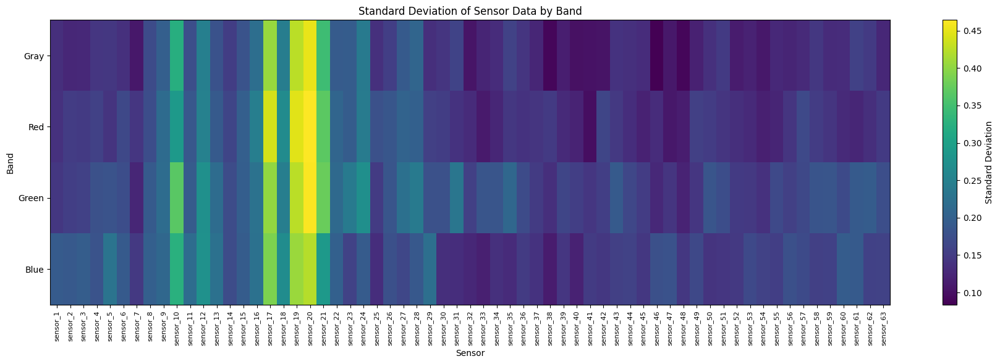

In [7]:
# Visualize the result as a heatmap
result_data = result_table_STD.set_index('Sensor').T
result_data = result_data.apply(pd.to_numeric)  # Convert values to numeric data types
fig, ax = plt.subplots(figsize=(18, 6))
heatmap = ax.imshow(result_data, cmap='viridis', aspect='auto')
plt.colorbar(heatmap, ax=ax, label='Standard Deviation')
ax.set_xticks(np.arange(len(sensors)))
ax.set_xticklabels(sensors, rotation=90, fontsize=8)
ax.set_yticks(np.arange(len(result_data.index)))
ax.set_yticklabels(result_data.index)
ax.set_xlabel('Sensor')
ax.set_ylabel('Band')
ax.set_title('Standard Deviation of Sensor Data by Band')
plt.tight_layout()
plt.show()

#### most responsive sensors

In [8]:
# Calculate the average std for each band
average_std = result_table_STD[['Gray', 'Red', 'Green', 'Blue']].mean(axis=1)

# Rank the sensors based on their average std values
ranked_sensors = average_std.sort_values(ascending=False)

# Get the top 10 most responsive sensors
top_10_sensors = ranked_sensors.index[:10]

# Print the result
print("\033[1;34mMost responsive sensor\033[0m:", top_10_sensors[0], "(Avg Std:", average_std[top_10_sensors[0]], ")")
print("\n\033[1;34mTop 10 most responsive sensors:\033[0m")
for i, sensor in enumerate(top_10_sensors[1:], start=2):
    suffix = "st" if i == 1 else "nd" if i == 2 else "rd" if i == 3 else "th"
    print(f"{i}{suffix}: {sensor} (Avg Std: {average_std[sensor]:.6f})")


Most responsive sensor: sensor_20 (Avg Std: 0.4501393176121016 )

Top 10 most responsive sensors:
2nd: sensor_19 (Avg Std: 0.425764)
3rd: sensor_17 (Avg Std: 0.409301)
4th: sensor_21 (Avg Std: 0.345299)
5th: sensor_10 (Avg Std: 0.325772)
6th: sensor_12 (Avg Std: 0.262008)
7th: sensor_18 (Avg Std: 0.256614)
8th: sensor_24 (Avg Std: 0.236763)
9th: sensor_16 (Avg Std: 0.229794)
10th: sensor_9 (Avg Std: 0.211379)


#### Most avg highest_sdt band 

In [9]:
# Calculate the average std for each band
average_std = result_table_STD[['Gray', 'Red', 'Green', 'Blue']].mean(axis=0)

# Rank the bands based on their average std values
ranked_bands = average_std.sort_values(ascending=False)

# Print the result in blue color
print("\033[94mMost Suitable Band for Further Analysis:\033[0m")
for i, band in enumerate(ranked_bands.index):
    avg_std = average_std[band]
    print(f"{i+1}st: {band} (Avg Std: {avg_std:.4f})")


Most Suitable Band for Further Analysis:
1st: Green (Avg Std: 0.1973)
2st: Blue (Avg Std: 0.1862)
3st: Red (Avg Std: 0.1763)
4st: Gray (Avg Std: 0.1643)


#

### SNR comparison 

In [10]:
# Compute standard deviation by columns (sensors) for each band
std_gray = np.std(df_gray.iloc[:, 1:], axis=0)
std_red = np.std(df_red.iloc[:, 1:], axis=0)
std_green = np.std(df_green.iloc[:, 1:], axis=0)
std_blue = np.std(df_blue.iloc[:, 1:], axis=0)

# Compute mean by columns (sensors) for each band
mean_gray = np.mean(df_gray.iloc[:, 1:], axis=0)
mean_red = np.mean(df_red.iloc[:, 1:], axis=0)
mean_green = np.mean(df_green.iloc[:, 1:], axis=0)
mean_blue = np.mean(df_blue.iloc[:, 1:], axis=0)

# Compute SNR for each band
snr_gray = mean_gray / std_gray
snr_red = mean_red / std_red
snr_green = mean_green / std_green
snr_blue = mean_blue / std_blue



# Create a table of SNR values
sensors = df_gray.columns[1:]  # Exclude the first column (assuming it contains frame data)
result_table_SNR = pd.DataFrame({'Sensor': sensors, 'Gray': snr_gray, 'Red': snr_red, 'Green': snr_green,
                             'Blue': snr_blue})


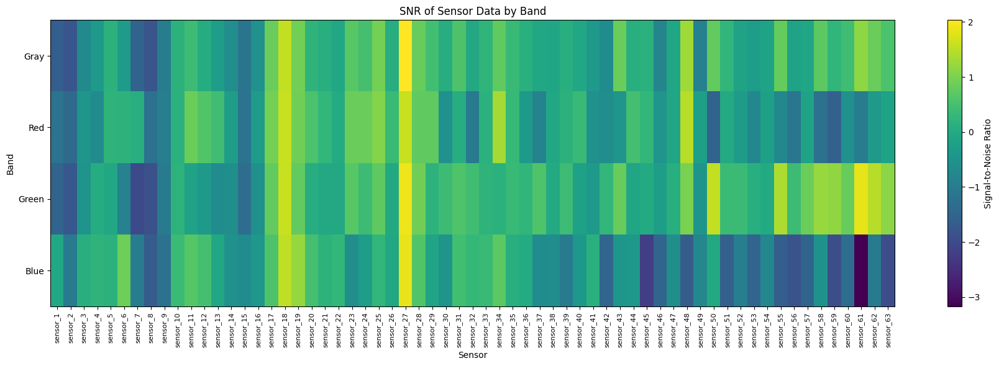

In [11]:
# Visualize the result as a heatmap
result_data = result_table_SNR.set_index('Sensor').T
result_data = result_data.apply(pd.to_numeric)  # Convert values to numeric data types
fig, ax = plt.subplots(figsize=(18, 6))
heatmap = ax.imshow(result_data, cmap='viridis', aspect='auto')
plt.colorbar(heatmap, ax=ax, label='Signal-to-Noise Ratio')
ax.set_xticks(np.arange(len(sensors)))
ax.set_xticklabels(sensors, rotation=90, fontsize=8)
ax.set_yticks(np.arange(len(result_data.index)))
ax.set_yticklabels(result_data.index)
ax.set_xlabel('Sensor')
ax.set_ylabel('Band')
ax.set_title('SNR of Sensor Data by Band')
plt.tight_layout()
plt.show()

#### Less noisy band 

In [12]:
# Calculate the average std for each band
average_SNR = result_table_SNR[['Gray', 'Red', 'Green', 'Blue']].mean(axis=0)

# Rank the bands based on their average std values
ranked_bands = average_SNR.sort_values()

# Print the result in blue color
print("\033[94mLess noisy:\033[0m")
for i, band in enumerate(ranked_bands.index):
    avg_std = average_std[band]
    print(f"{i+1}st: {band} (Avg SNR: {avg_std:.4f})")

Less noisy:
1st: Blue (Avg SNR: 0.1862)
2st: Red (Avg SNR: 0.1763)
3st: Gray (Avg SNR: 0.1643)
4st: Green (Avg SNR: 0.1973)


#

#

### Visualization bands

### Plot Green Band

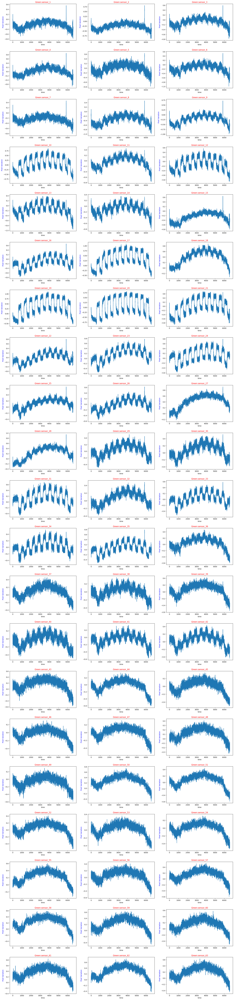

In [13]:
# Get the column names excluding the frame column
df = df_green
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    ax.set_title(f"Green:{sensor}", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#### Filtred Δ%R green data

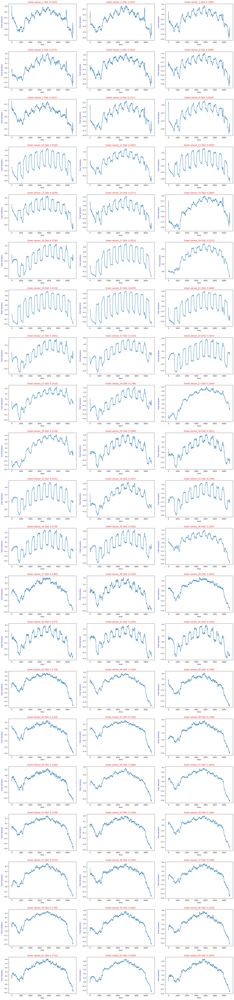

In [14]:
# Get the column names excluding the frame column
sensor_columns = df_green.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Apply moving average and plot the smoothed data
window_size = 50 # Adjust the window size as desired
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    filtered_data = df_green[sensor].rolling(window=window_size, min_periods=1).mean()
    ax.plot(df_green['time'], filtered_data) 
    std_value = np.std(df_green[sensor].rolling(window=window_size, min_periods=1).mean().iloc[window_size - 1:].values)
    ax.set_title(f"Green {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis


# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Gray band 

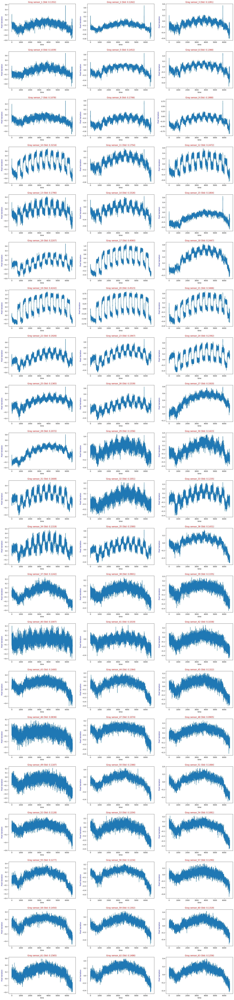

In [15]:
# Get the column names excluding the frame column
df = df_gray
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"Gray {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Red band

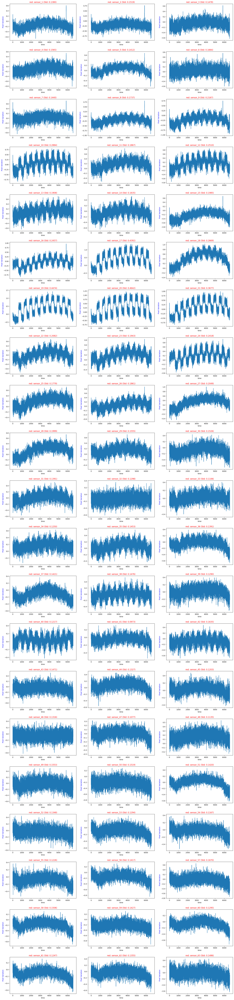

In [16]:
# Get the column names excluding the frame column
df = df_red
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"red: {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Blue Band 

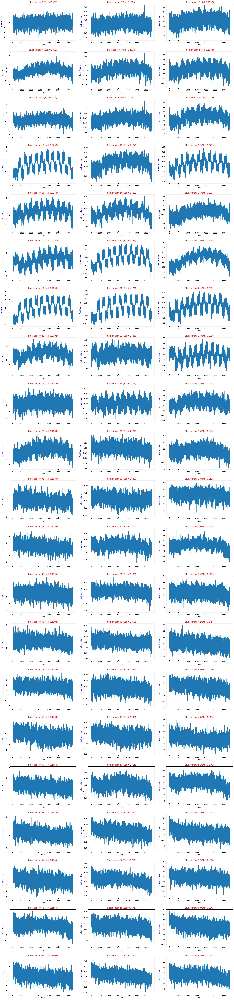

In [17]:
# Get the column names excluding the frame column
df = df_blue
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"Blue: {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### plot the 4 bands data for the 10 most responsive sensors


The 10 most responsive sensors



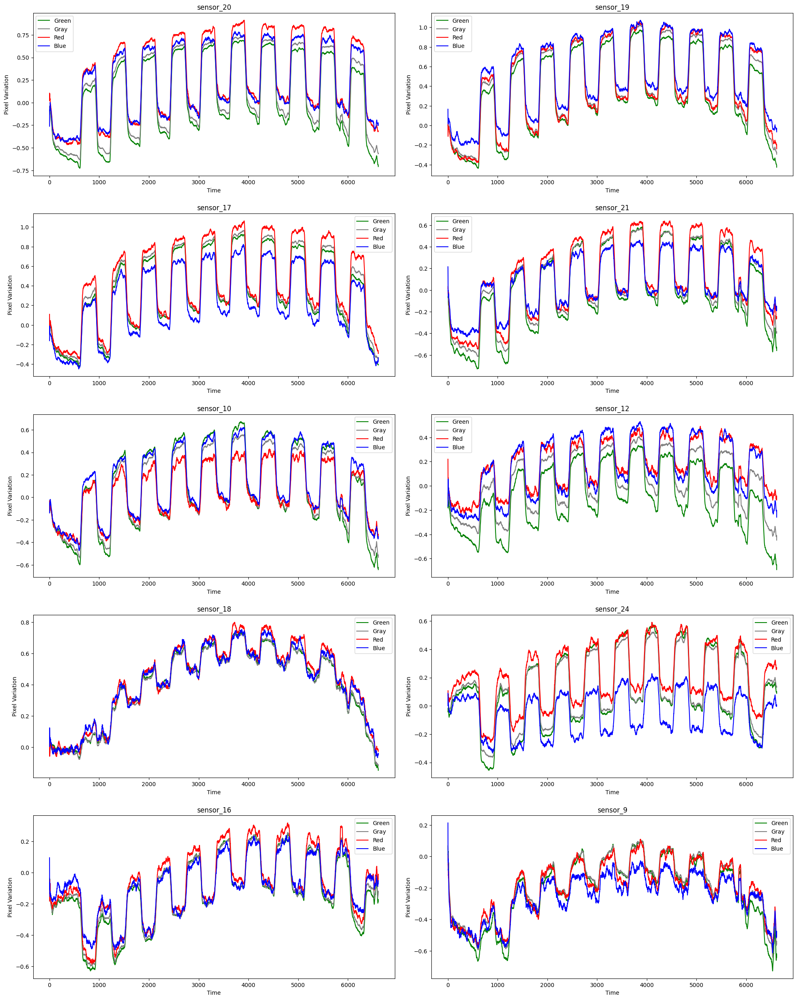

In [18]:
# Define the number of sensors to plot
num_sensors = 10  # Adjust the number of sensors as desired

# Get the top 10 most responsive sensors
top_sensors = ranked_sensors.index[:num_sensors]

# Set the layout of the subplots
subplot_rows = int((num_sensors + 1) / 2)  # Adjust the number of rows as needed
subplot_cols = 2  # Number of columns is fixed at 2 for two subplots per row

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 5 * subplot_rows))

# Flatten the axes array if necessary
axes = axes.flatten()


# Print the title with an increased font size
print('\n\033[1mThe 10 most responsive sensors\033[0m\n')

# Apply moving average and plot the smoothed data for each sensor and band
window_size = 50  # Adjust the window size as desired
for i, sensor in enumerate(top_sensors):
    ax = axes[i]
    filtered_green = df_green[sensor].rolling(window=window_size, min_periods=1).mean()
    filtered_gray = df_gray[sensor].rolling(window=window_size, min_periods=1).mean()
    filtered_red = df_red[sensor].rolling(window=window_size, min_periods=1).mean()
    filtered_blue = df_blue[sensor].rolling(window=window_size, min_periods=1).mean()

    ax.plot(df_green['time'], filtered_green, label='Green', color='green')
    ax.plot(df_gray['time'], filtered_gray, label='Gray', color='gray')
    ax.plot(df_red['time'], filtered_red, label='Red', color='red')
    ax.plot(df_blue['time'], filtered_blue, label='Blue', color='blue')
    ax.set_title(f"{sensor}")
    ax.set_xlabel('Time')
    ax.set_ylabel('Pixel Variation')
    ax.legend()

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)

# Show the plot
plt.show()



####

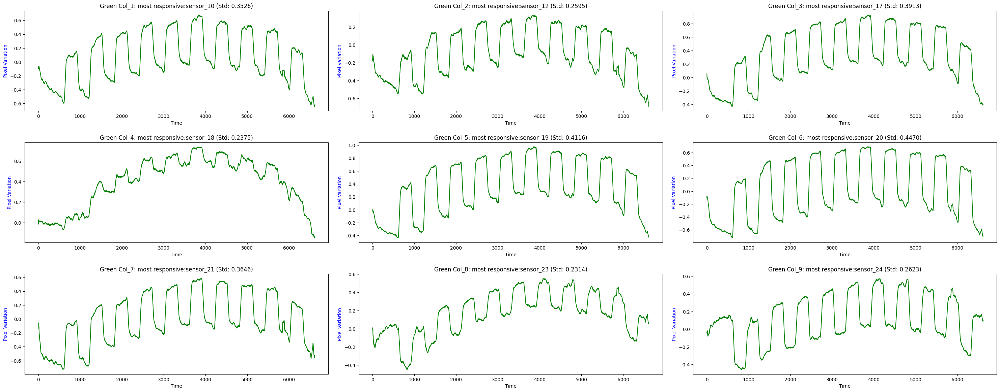

In [4]:
# Rename the column "sensor_6" to "sensor_06"
df_green = df_green.rename(columns={"sensor_6": "sensor_06"})

# Get the column names excluding the frame column
sensor_columns = df_green.columns[1:]

# Sort the sensors based on their std values in descending order
sorted_sensors = df_green[sensor_columns].std().sort_values(ascending=False)




# Select the top 9 most responsive sensors
top_sensors = sorted_sensors.index[:9]

# Sort the sensors based on their names in ascending order
sorted_sensors = sorted(top_sensors)


# Determine the number of subplots needed
num_subplots = len(top_sensors)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(30, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Apply moving average and plot the smoothed data for the selected sensors
window_size = 50  # Adjust the window size as desired
for i, sensor in enumerate(sorted_sensors):
    ax = axes[i] if num_subplots > 1 else axes
    filtered_data = df_green[sensor].rolling(window=window_size, min_periods=1).mean()
    ax.plot(df_green['time'], filtered_data, color='green')
    std_value = np.std(df_green[sensor].rolling(window=window_size, min_periods=1).mean().iloc[window_size - 1:].values)
   # title_range = f"{i+1}{'st' if i==0 else 'nd' if i==1 else 'rd' if i==2 else 'th'}"
    ax.set_title(f"Green Col_{i+1}: most responsive:{sensor} (Std: {std_value:.4f})")
    ax.set_xlabel('Time')
    ax.set_ylabel('Pixel Variation', color='blue') 
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()


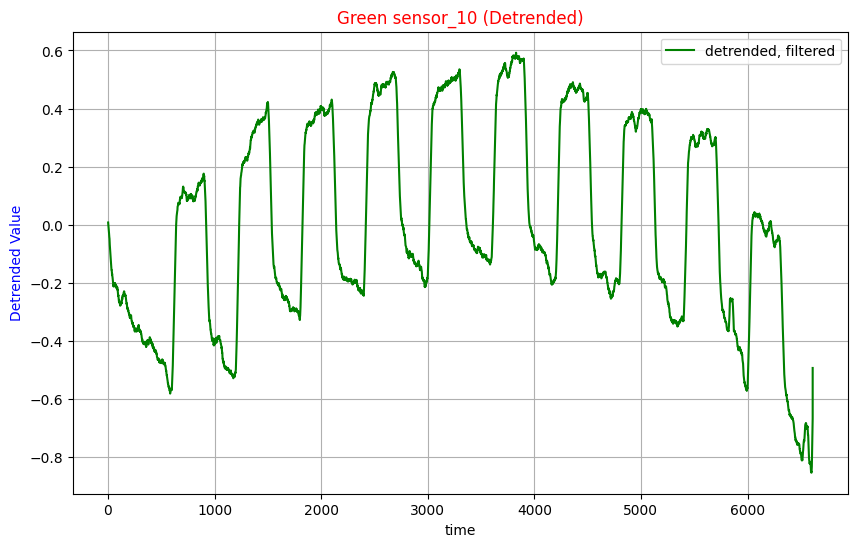

In [6]:
from scipy.signal import detrend

# Get the data for the specified sensor
sensor_to_detrend = 'sensor_10'  # Specify the sensor to detrend
data = df_green[sensor_to_detrend].values.astype(float)
time = df_green['time'].values.astype(float)

# Apply moving average filter
window_size = 40  # Adjust the window size as desired
filtered_data = np.convolve(data, np.ones(window_size)/window_size, mode='same')

# Perform detrending using scipy.signal.detrend on the filtered data
detrended_data = detrend(filtered_data, type="linear")


# Plot the detrended data
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot(time, detrended_data, color='green',label = 'detrended, filtered')
#plt.plot(time, data, color='blue', label = 'original')
plt.title(f"Green {sensor_to_detrend} (Detrended)", color='red' )
plt.xlabel('time')
plt.ylabel('Detrended Value', color='blue')
plt.grid(True)
plt.legend()

# Show the plot
plt.show()


### 

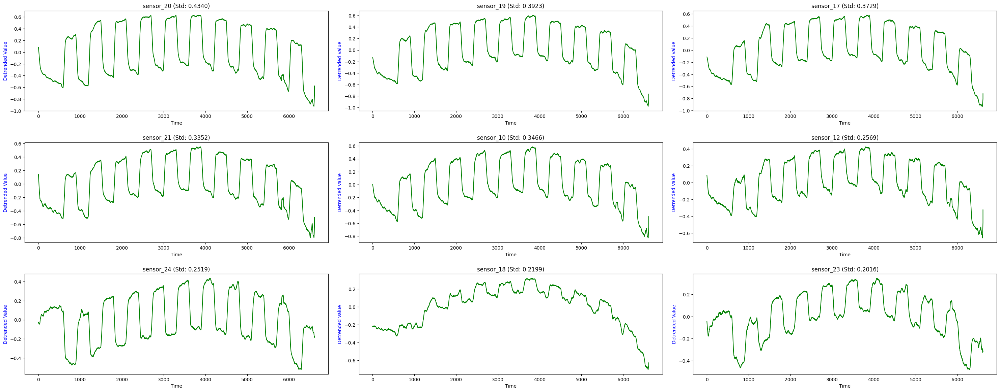

In [8]:
# Rename the column "sensor_6" to "sensor_06"
df_green = df_green.rename(columns={"sensor_6": "sensor_06"})

# Get the column names excluding the frame column
sensor_columns = df_green.columns[1:]

# Sort the sensors based on their std values in descending order
sorted_sensors = df_green[sensor_columns].std().sort_values(ascending=False)

# Select the top 9 most responsive sensors
top_sensors = sorted_sensors.index[:9]

# Set the layout of the subplots
num_subplots = len(top_sensors)
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(30, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Apply moving average and plot the smoothed data for the selected sensors
window_size = 50  # Adjust the window size as desired
for i, sensor in enumerate(top_sensors):
    ax = axes[i] if num_subplots > 1 else axes
    data = df_green[sensor].values.astype(float)

    # Apply moving average filter
    filtered_data = np.convolve(data, np.ones(window_size) / window_size, mode='same')

    # Perform detrending using scipy.signal.detrend on the filtered data
    detrended_data = detrend(filtered_data)

    # Plot the detrended data
    ax.plot(df_green['time'], detrended_data, color='green')
    std_value = np.std(detrended_data)
    ax.set_title(f"{sensor} (Std: {std_value:.4f})")
    ax.set_xlabel('Time')
    ax.set_ylabel('Detrended Value', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

In [12]:
from scipy.signal import find_peaks


In [13]:
def extract_desired_peaks(peak_data, data, period):
    distances = [abs(data[peak_data[i]] - data[peak_data[i+1]]) for i in range(len(peak_data)-1)]
    
    # Find the indices of the two pairs of consecutive peaks with the highest distances
    max_distances_indices = sorted(range(len(distances)), key=lambda i: distances[i], reverse=True)[:2*period]
    
    # Get the corresponding peaks
    desired_peaks = [(peak_data[i], peak_data[i+1]) for i in max_distances_indices]
    
    return desired_peaks

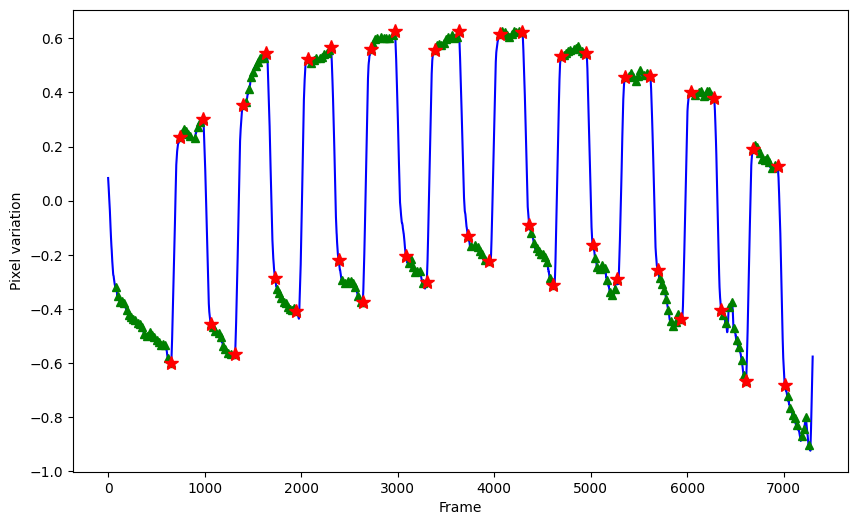

In [16]:
# Find all peaks
peaks, _ = find_peaks(detrended_data, distance=20)

# Extract the desired peaks
desired_peaks = extract_desired_peaks(peaks,detrended_data, 10)

# Plot the original curve and the desired peaks
plt.figure(figsize=(10, 6))
plt.plot(detrended_data, 'b-', label='Sensor Data')
plt.plot(peaks, detrended_data[peaks], 'g^', label='Peaks')
for peak in desired_peaks:
    x1, x2 = peak
    plt.plot([x1, x2], [detrended_data[x1], detrended_data[x2]], 'r*', markersize=10, label='Desired Peaks')
plt.xlabel('Frame')
plt.ylabel('Pixel variation')
#plt.legend()
plt.show()

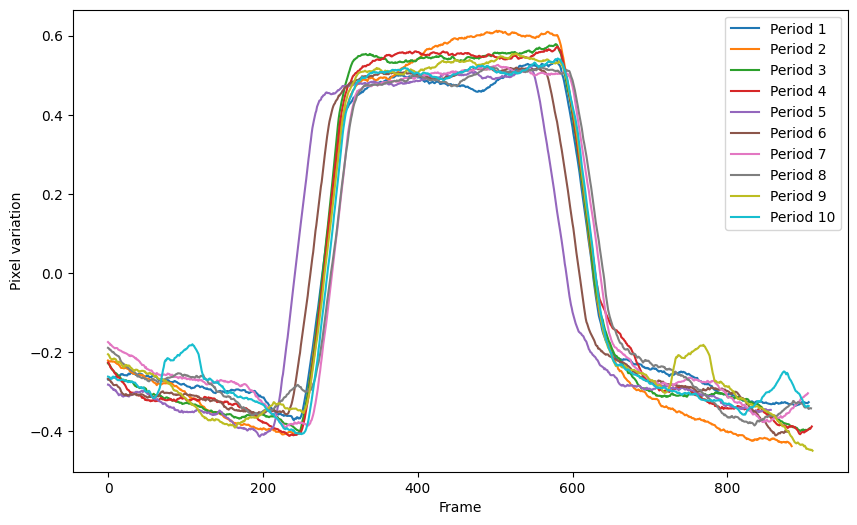

In [37]:
# Define the desired number of periods and desired peaks per period
num_periods = 10
peaks_per_period = 4

# Flatten the desired peaks list
flattened_peaks = [peak for pair in desired_peaks for peak in pair]

# Sort the flattened peaks based on their indices
flattened_peaks = sorted(flattened_peaks)

# Calculate the distance between the 4th and 5th peak
fourth_peak = flattened_peaks[3]
fifth_peak = flattened_peaks[4]
distance = fifth_peak - fourth_peak

# Perform segmentation
segments = []
for i in range(num_periods):
    start_index = i * peaks_per_period
    end_index = start_index + peaks_per_period - 1
    
    # Define the beginning and end of the current period
    if i == 0:
        segment_start = flattened_peaks[start_index] - distance
        segment_end = flattened_peaks[end_index + 1]
    elif i == num_periods - 1:
        segment_start = flattened_peaks[start_index - 1]
        segment_end = flattened_peaks[end_index] + distance
    else:
        segment_start = flattened_peaks[start_index - 1]
        segment_end = flattened_peaks[end_index + 1]
    
    segment = detrended_data[segment_start:segment_end]
    detrended_segment = detrend(segment)
    segments.append(detrended_segment)

# Plot the segments and desired peaks
plt.figure(figsize=(10, 6))
for i, segment in enumerate(segments):
    plt.plot(segment, label=f"Period {i+1}")


plt.xlabel('Frame')
plt.ylabel('Pixel variation')
plt.legend()
plt.show()


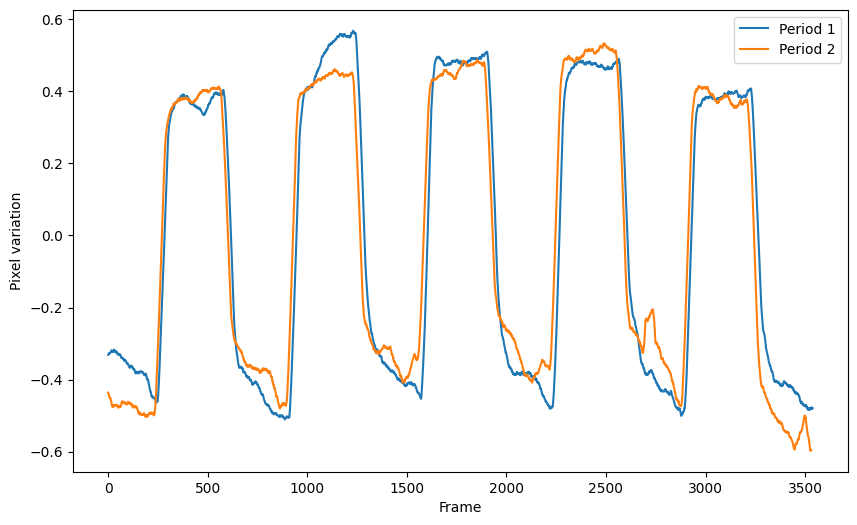

In [40]:
# Define the desired number of periods and desired peaks per period
num_periods = 2
peaks_per_period = 20
# Flatten the desired peaks list
flattened_peaks = [peak for pair in desired_peaks for peak in pair]

# Sort the flattened peaks based on their indices
flattened_peaks = sorted(flattened_peaks)

# Calculate the distance between the 4th and 5th peak
fourth_peak = flattened_peaks[3]
fifth_peak = flattened_peaks[4]
distance = fifth_peak - fourth_peak

# Perform segmentation
segments_moitie = []
for i in range(num_periods):
    start_index = i * peaks_per_period
    end_index = start_index + peaks_per_period - 1
    
    # Define the beginning and end of the current period
    if i == 0:
        segment_start = flattened_peaks[start_index] - distance
        segment_end = flattened_peaks[end_index + 1]
    elif i == num_periods - 1:
        segment_start = flattened_peaks[start_index - 1]
        segment_end = flattened_peaks[end_index] + distance
    else:
        segment_start = flattened_peaks[start_index - 1]
        segment_end = flattened_peaks[end_index + 1]
    
    segment_moitie = detrended_data[segment_start:segment_end]
    detrended_segment = detrend(segment_moitie)
    segments_moitie.append(detrended_segment)

# Plot the segments and desired peaks
plt.figure(figsize=(10, 6))
for i, segment_moitie in enumerate(segments_moitie):
    plt.plot(segment_moitie, label=f"Period {i+1}")


plt.xlabel('Frame')
plt.ylabel('Pixel variation')
plt.legend()
plt.show()


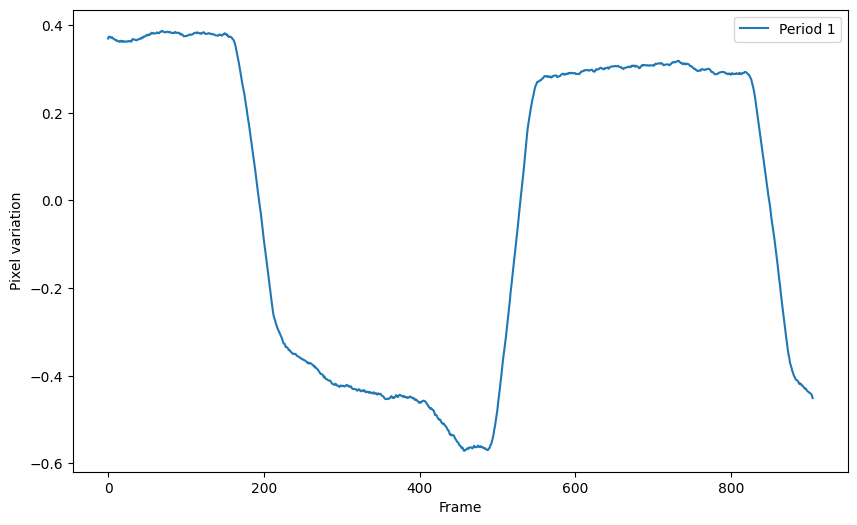

In [36]:
# Define the desired number of periods and desired peaks per period
num_periods = 1
peaks_per_period = 4

# Flatten the desired peaks list
flattened_peaks = [peak for pair in desired_peaks for peak in pair]

# Sort the flattened peaks based on their indices
flattened_peaks = sorted(flattened_peaks)

# Calculate the distance between the 4th and 5th peak
fourth_peak = flattened_peaks[3]
fifth_peak = flattened_peaks[4]
distance = fifth_peak - fourth_peak

# Perform segmentation
segments = []
for i in range(num_periods):
    start_index = i * peaks_per_period
    end_index = start_index + peaks_per_period - 1
    
    # Define the beginning and end of the current period
    if i == 0:
        segment_start = flattened_peaks[start_index] - distance
        segment_end = flattened_peaks[end_index + 1]
    elif i == num_periods - 1:
        segment_start = flattened_peaks[start_index - 1]
        segment_end = flattened_peaks[end_index] + distance
    else:
        segment_start = flattened_peaks[start_index - 1]
        segment_end = flattened_peaks[end_index + 1]
    
    segment_second = segment[segment_start:segment_end]
    detrended_segment = detrend(segment_second)
    segments.append(detrended_segment)

# Plot the segments and desired peaks
plt.figure(figsize=(10, 6))
for i, segment_second in enumerate(segments):
    plt.plot(segment_second, label=f"Period {i+1}")


plt.xlabel('Frame')
plt.ylabel('Pixel variation')
plt.legend()
plt.show()

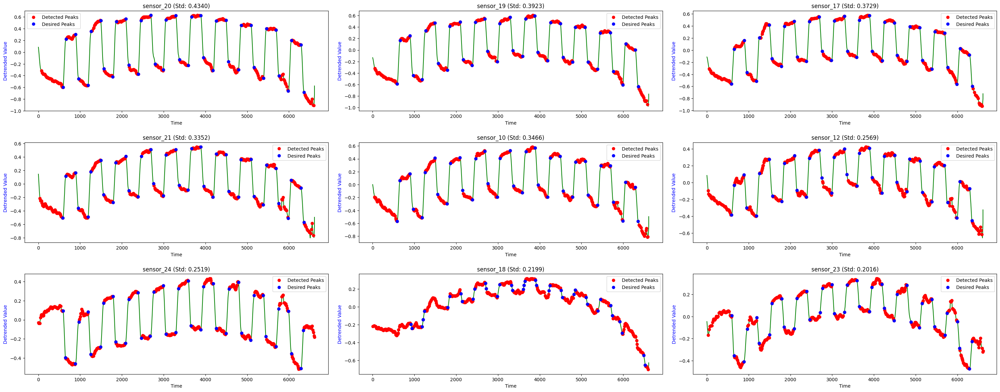

In [41]:
# Rename the column "sensor_6" to "sensor_06"
df_green = df_green.rename(columns={"sensor_6": "sensor_06"})

# Get the column names excluding the frame column
sensor_columns = df_green.columns[1:]

# Sort the sensors based on their std values in descending order
sorted_sensors = df_green[sensor_columns].std().sort_values(ascending=False)

# Select the top 9 most responsive sensors
top_sensors = sorted_sensors.index[:9]

# Set the layout of the subplots
num_subplots = len(top_sensors)
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(30, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Apply moving average and plot the smoothed data for the selected sensors
window_size = 50  # Adjust the window size as desired
for i, sensor in enumerate(top_sensors):
    ax = axes[i] if num_subplots > 1 else axes
    data = df_green[sensor].values.astype(float)

    # Apply moving average filter
    filtered_data = np.convolve(data, np.ones(window_size) / window_size, mode='same')

    # Perform detrending using scipy.signal.detrend on the filtered data
    detrended_data = detrend(filtered_data)

    # Find peaks in the detrended data
    peaks, _ = find_peaks(detrended_data, distance=10)

    # Extract the desired peaks
    desired_peaks = extract_desired_peaks(peaks, detrended_data,10)

    # Flatten the desired peaks list
    flattened_peaks = [peak for pair in desired_peaks for peak in pair]

    # Plot the detrended data
    ax.plot(df_green['time'], detrended_data, color='green')
    ax.plot(df_green['time'][peaks], detrended_data[peaks], 'ro', label='Detected Peaks')
    ax.plot(df_green['time'][flattened_peaks], detrended_data[flattened_peaks], 'bo', label='Desired Peaks')
    std_value = np.std(detrended_data)
    ax.set_title(f"{sensor} (Std: {std_value:.4f})")
    ax.set_xlabel('Time')
    ax.set_ylabel('Detrended Value', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis
    ax.legend()

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()


### detrended period

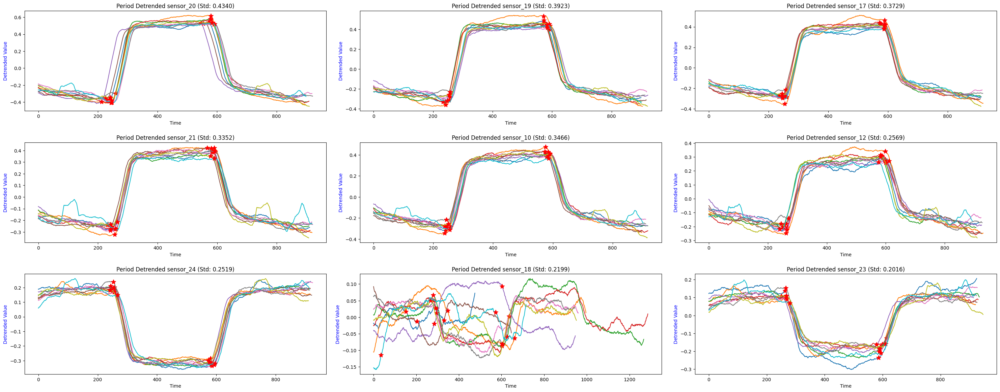

In [45]:
# Rename the column "sensor_6" to "sensor_06"
df_green = df_green.rename(columns={"sensor_6": "sensor_06"})

# Get the column names excluding the frame column
sensor_columns = df_green.columns[1:]

# Sort the sensors based on their std values in descending order
sorted_sensors = df_green[sensor_columns].std().sort_values(ascending=False)

# Select the top 9 most responsive sensors
top_sensors = sorted_sensors.index[:9]

# Set the layout of the subplots
num_subplots = len(top_sensors)
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(30, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Apply moving average and plot the smoothed data for the selected sensors
window_size = 50  # Adjust the window size as desired
num_periods = 10  # Adjust the desired number of periods
peaks_per_period = 4  # Adjust the desired number of peaks per period

for i, sensor in enumerate(top_sensors):
    ax = axes[i] if num_subplots > 1 else axes
    data = df_green[sensor].values.astype(float)

    # Apply moving average filter
    filtered_data = np.convolve(data, np.ones(window_size) / window_size, mode='same')

    # Perform detrending using scipy.signal.detrend on the filtered data
    detrended_data = detrend(filtered_data)

    # Find peaks in the detrended data
    peaks, _ = find_peaks(detrended_data, distance=1)

    # Extract the desired peaks
    desired_peaks = extract_desired_peaks(peaks, detrended_data,10)

    # Flatten the desired peaks list
    flattened_peaks = [peak for pair in desired_peaks for peak in pair]
    
    # Sort the flattened peaks based on their indices
    flattened_peaks = sorted(flattened_peaks)
    
    # Calculate the distance between the 4th and 5th peak
    fourth_peak = flattened_peaks[3]
    fifth_peak = flattened_peaks[4]
    eighth_peak = flattened_peaks[7]
    nineth_peak = flattened_peaks[8]
    distance1 = fifth_peak - fourth_peak
    distance2 = nineth_peak - eighth_peak
    distance = int((distance1 + distance2) / 2)
    
    # Perform segmentation
    segments = []
    for j in range(num_periods):
        start_index = j * peaks_per_period
        end_index = start_index + peaks_per_period - 1

        # Define the beginning and end of the current period
        if j == 0:
            segment_start = flattened_peaks[start_index] - distance
            segment_end = flattened_peaks[end_index + 1]
        elif j == num_periods - 1:
            segment_start = flattened_peaks[start_index - 1]
            segment_end = flattened_peaks[end_index] + distance
        else:
            segment_start = flattened_peaks[start_index - 1]
            segment_end = flattened_peaks[end_index + 1]

        segment = detrended_data[segment_start:segment_end]
        detrended_segment = detrend(segment)
        segments.append(detrended_segment)

    for i, segment in enumerate(segments):
        ax.plot(segment, label=f"Period {i+1}")
         # Find the desired peaks for the current segment
        segment_peaks = find_peaks(segment, distance=10)[0]
        desired_peaks2 = extract_desired_peaks(segment_peaks, segment, 1)
        for peak in desired_peaks2:
            ax.plot(peak[0], segment[peak[0]], 'r*', markersize=10, label='Desired Peaks')


    std_value = np.std(detrended_data)
    ax.set_title(f"Period Detrended {sensor} (Std: {std_value:.4f})")
    ax.set_xlabel('Time')
    ax.set_ylabel('Detrended Value', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis
    #ax.legend()

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()
